In [4]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session


import numpy as np 
import pandas as pd 
#import pandas_profiling
from matplotlib import pyplot as plt
import seaborn as sns
import re
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import accuracy_score, log_loss
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
import xgboost as xgb
from sklearn.metrics import roc_auc_score
import lightgbm as lgb
from skopt import BayesSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn import decomposition
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn import metrics
%matplotlib inline
pd.set_option('display.max_columns',150)

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


/kaggle/input/churnprediction/DS_Assignment.xlsx
/kaggle/input/churnprediction/DS_Assignment.xlsx


In [5]:
!pip install openpyxl
!pip install pandas-profiling[notebook]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.1/242.1 kB 887.3 kB/s eta 0:00:00a 0:00:01


In [6]:

data_path = "/kaggle/input/churnprediction/DS_Assignment.xlsx"

df = pd.DataFrame(pd.read_excel(data_path))
  
# show the dataframe
df

,userID,Contact_ind,Customer_status,ActiveSinceDays,num_AcD_m0,num_AcD_m1,r_AcD_m0_m12,r_AcD_m0_m123,daystofirstload,dayssincelastload,tot_RevUo_m0,tot_RevUo_m1,tot_RevUo_m2,r_tot_RevUo_m0_m1,r_tot_RevUo_m1_m2,r_tot_RevUo_m0_m12,avg_RevUo_m0,avg_RevUo_m1,avg_RevUo_m2,chg_RevUo_l0_1m,chg_RevUo_l1_2m,chg_RevUo_l2_3m,tot_LdCnt_m0,tot_LdCnt_m1,tot_LdCnt_m2,max_RevUo_m0,max_RevUo_m1,max_RevUo_m2,r_avg_RevUo_m0_m1,r_avg_RevUo_m1_m2,avgdays_btw_loads_l6,tot_failed_LdTxnCnt_3m,r_failed_LdTxnCnt_m0_m12,tot_rtlX_m0,tot_rtlX_m1,tot_rtlX_m2,r_tot_rtlX_m0_m1,r_tot_rtlX_m1_m2,r_tot_rtlX_m0_m12,avg_rtlX_m0,avg_rtlX_m1,avg_rtlX_m2,max_rtlX_m0,max_rtlX_m1,max_rtlX_m2,r_avg_max_rtlX_m0,r_avg_max_rtlX_m1,r_avg_max_rtlX_m2,RtlTxns_cnt_m0,RtlTxns_cnt_m1,RtlTxns_cnt_m2,r_RtlTxns_cnt_m0_m1,r_RtlTxns_cnt_m1_m2,sum_r_RtlTxns_cnt,fail_RtlTxncnt_m0,RtlTxn_dayscnt_m0,RtlTxn_dayscnt_m1,RtlTxn_dayscnt_m2,tot_rechX_m0,tot_rechX_m1,tot_rechX_m2,chg_rechX_l0_1m,chg_rechX_l1_2m,avg_rechX_m0,avg_rechX_m1,avg_rechX_m2,max_rechX_m0,max_rechX_m1,max_rechX_m2,r_avg_max_rechX_m0,r_avg_max_rechX_m1,r_avg_max_rechX_m2,rechtxns_cnt_m0,rechtxns_cnt_m1,rechtxns_cnt_m2,rechtxn_dayscnt_m0,rechtxn_dayscnt_m1,rechtxn_dayscnt_m2,billX_amt_m0,billX_amt_m1,billX_amt_m2,tot_billX_amt_m012,r_billX_amt_m0_m1,r_billX_amt_m0_m12,r_billX_amt_m1_m2,billX_cnt_m0,billX_cnt_m1,billX_cnt_m2,rech_amt_m0,rech_amt_m1,rech_amt_m2,r_rech_amt_m0_m1,r_rech_amt_m1_m2,sum_r_rech_amt_m1m2_m0m1,r_rech_amt_m0_m12,avgbal_m0,avgbal_m1,avgbal_m2,resolved_cnt_m2,tot_resolved_cnt_m012,percent_resolved_3m,InAllRev_m0,InAllRev_m1,InAllRev_m2,r_InAllRev_m0_m1,r_InAllRev_m0_m2,tot_InAllRev_3m,OgAllRev_m0,OgAllRev_m1,OgAllRev_m2,tot_OgAllRev_3m,targetid
0,5001.0,1.0,4.0,220.0,5.0,2.0,200.000000,300.000000,0.0,39.0,1299.0,0.0,500.00,129900.000000,0.000000,518.562874,324.75,0.000000,500.000000,-999.000000,-100.000000,-999.000000,4.0,0.0,1.0,500.0,0.0,500.0,32475.000000,0.000000,-999.0,0.0,0.00,1010.0,0.00,240.00,1010.0,0.000000,4.190871,336.666667,0.00,120.0000,710.0,0.00,160.00,0.474178,NaN,0.750000,3.0,0.0,2.0,300.0,0.0,300.0,0.0,3.0,0.0,1.0,0.0,0.0,199.0,-999.000000,-100.000000,0.000000,0.000000,199.0,0.0,0.0,199.0,NaN,NaN,1.000000,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,199.0,0.000000,0.000000,0.000000,0.000000,210.576667,128.410000,176.210357,0.0,0.0,0.0,1299.0,0.0,500.00,129900.000000,259.281437,1799.00,1010.0,0.00,439.00,1449.00,0.0
1,5002.0,1.0,3.0,1489.0,2.0,1.0,200.000000,300.000000,1388.0,125.0,0.0,1000.0,0.00,0.000000,100000.000000,0.000000,0.00,1000.000000,0.000000,-100.000000,-999.000000,-999.000000,0.0,1.0,0.0,0.0,1000.0,0.0,0.000000,100000.000000,-999.0,0.0,0.00,0.0,0.00,0.00,0.0,0.000000,0.000000,0.000000,0.00,0.0000,0.0,0.00,0.00,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1649.0,710.0,0.0,132.253521,-999.000000,549.666667,355.000000,0.0,1000.0,510.0,0.0,0.549667,0.696078,NaN,3.0,2.0,0.0,2.0,1.0,0.0,1000.0,0.0,0.0,1000.0,100000.0,200000.0,0.0,1.0,0.0,0.0,649.0,710.0,0.0,91.279887,71000.000000,71091.279890,182.559775,119.172414,280.645161,0.000000,0.0,0.0,0.0,0.0,1000.0,0.00,0.000000,0.000000,1000.00,1649.0,710.00,0.00,2359.00,1.0
2,5003.0,1.0,4.0,507.0,1.0,10.0,18.181818,23.076923,-999.0,-999.0,0.0,0.0,0.00,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,-999.000000,-999.000000,-999.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,-999.0,0.0,0.00,0.0,4105.59,0.00,0.0,4105.590000,0.000000,0.000000,1368.53,0.0000,0.0,1410.00,0.00,NaN,0.970589,NaN,0.0,3.0,0.0,0.0,300.0,300.0,0.0,0.0,3.0,0.0,7.0,990.0,0.0,-99.292929,-999.000000,7.000000,141.428571,0.0,7.0,497.0,0.0,1.000000,0.284565,NaN,1.0,7.0,0.0,1.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,990.0,0.0,0.706357,99000.000000,99000.706360,1.412714,1.259310,535.180323,0.010000,0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.000000,0.00,7.0,5095.59,0.00,5102.59,1.0
3,5004.0,1.0,2.0,561.0,9.0,1.0,450.000000,385.714286,30.0,8.0,51500.0,3162.0,3000.00,1628.201075,105.364878,1671.263995,6437.50,1581.0

In [7]:
df.columns.tolist()

['userID',
 'Contact_ind',
 'Customer_status',
 'ActiveSinceDays',
 'num_AcD_m0',
 'num_AcD_m1',
 'r_AcD_m0_m12',
 'r_AcD_m0_m123',
 'daystofirstload',
 'dayssincelastload',
 'tot_RevUo_m0',
 'tot_RevUo_m1',
 'tot_RevUo_m2',
 'r_tot_RevUo_m0_m1',
 'r_tot_RevUo_m1_m2',
 'r_tot_RevUo_m0_m12',
 'avg_RevUo_m0',
 'avg_RevUo_m1',
 'avg_RevUo_m2',
 'chg_RevUo_l0_1m',
 'chg_RevUo_l1_2m',
 'chg_RevUo_l2_3m',
 'tot_LdCnt_m0',
 'tot_LdCnt_m1',
 'tot_LdCnt_m2',
 'max_RevUo_m0',
 'max_RevUo_m1',
 'max_RevUo_m2',
 'r_avg_RevUo_m0_m1',
 'r_avg_RevUo_m1_m2',
 'avgdays_btw_loads_l6',
 'tot_failed_LdTxnCnt_3m',
 'r_failed_LdTxnCnt_m0_m12',
 'tot_rtlX_m0',
 'tot_rtlX_m1',
 'tot_rtlX_m2',
 'r_tot_rtlX_m0_m1',
 'r_tot_rtlX_m1_m2',
 'r_tot_rtlX_m0_m12',
 'avg_rtlX_m0',
 'avg_rtlX_m1',
 'avg_rtlX_m2',
 'max_rtlX_m0',
 'max_rtlX_m1',
 'max_rtlX_m2',
 'r_avg_max_rtlX_m0',
 'r_avg_max_rtlX_m1',
 'r_avg_max_rtlX_m2',
 'RtlTxns_cnt_m0',
 'RtlTxns_cnt_m1',
 'RtlTxns_cnt_m2',
 'r_RtlTxns_cnt_m0_m1',
 'r_RtlTxns_cnt

In [8]:
inspection_cols =['ActiveSinceDays','avgdays_btw_loads_l6','Contact_ind','Customer_status','dayssincelastload','daystofirstload']
data_inspection = df[inspection_cols]
data_inspection

,ActiveSinceDays,avgdays_btw_loads_l6,Contact_ind,Customer_status,dayssincelastload,daystofirstload
0,220.0,-999.0,1.0,4.0,39.0,0.0
1,1489.0,-999.0,1.0,3.0,125.0,1388.0
2,507.0,-999.0,1.0,4.0,-999.0,-999.0
3,561.0,-999.0,1.0,2.0,8.0,30.0
4,1437.0,-999.0,1.0,4.0,63.0,375.0
...,...,...,...,...,...,...
44995,401.0,-999.0,1.0,3.0,108.0,6.0
44996,200.0,-999.0,1.0,2.0,-999.0,-999.0
44997,557.0,-999.0,1.0,4.0,35.0,0.0
44998,1075.0,-999.0,1.0,3.0,36.0,988.0


In [9]:
df[inspection_cols].nunique()

ActiveSinceDays         2349
avgdays_btw_loads_l6       1
Contact_ind                2
Customer_status            6
dayssincelastload        245
daystofirstload         1775
dtype: int64

In [10]:
df.Customer_status.unique()

array([   4.,    3.,    2.,    0.,    1., -999.])

## Description of Features:
1. ActiveSinceDays : values are Days since when user is active on the platform.
1. Contact_ind : Indicator whether customer's contact number is available at the platform or not.
1. Customer_status : Activity status of the customer.
*Rest all features are with respect to load. Don't know exactly what it means w.r.t to transaction, churn, or onboarding either. But let's guess business meaning of the feature beyond loading. Assuming load means when customer loads its shopping cart.*

1. avgdays_btw_loads_l6 : Average of number of days for load in 6th month.
1. dayssincelastload : Number of days since when the customer did last loading.
1. daystofirstload : Number of days since when customer did loading for the first time.

## Feature Engineering
*loading_period = daystofirstload - dayssincelastload*

Remarks
After glancing through all the varibales, it is evident that these are not the base features (raw faetures). These features have been derived out of the raw data and also, some modeling has already been performed upon it to collate the best features. avgdays_btw_loads_l6 is an example of best feature of model because, none of the other avgdays_btw_loads_* (l1,l2,l3,l4,l5 etc.) is present in data. other exmaples are some of the ratio related features.
Customers are as old as 8.5 years and the most new customer is 72 days old & on an averge customer is 2 year old.
There are 5 classes of activity status defined by the business for a customer.
Please refer to attaCorrelation details between features as follows -

In [11]:
#Get missing columns
df.columns[df.isna().sum()>0]

Index(['r_avg_max_rtlX_m0', 'r_avg_max_rtlX_m1', 'r_avg_max_rtlX_m2',
       'r_avg_max_rechX_m0', 'r_avg_max_rechX_m1', 'r_avg_max_rechX_m2'],
      dtype='object')

In [12]:
missing_val_columns  = ['r_avg_max_rtlX_m0', 'r_avg_max_rtlX_m1', 'r_avg_max_rtlX_m2','r_avg_max_rechX_m0', 'r_avg_max_rechX_m1', 'r_avg_max_rechX_m2']

In [13]:
#Missing Value Imputation as per already followed pattern = -999. We may use KNN Imputation but that should be done during data preparation
df[df.isna()]=-999

In [14]:
df.columns[df.isna().sum()>0]

Index([], dtype='object')

In [15]:
#drop_Columns = list(data.nunique()[data.nunique()==1].index)
drop_Columns = list(df.nunique()[df.nunique()==1].index)
drop_Columns

['avgdays_btw_loads_l6', 'fail_RtlTxncnt_m0']

In [16]:
#Bill Amount & Count Analysis
bill_amount_cols = [i for i in df.columns if i.startswith('billX_amt')]
bill_count_cols = [i for i in df.columns if i.startswith('billX_cnt')]
bill_derived_cols = [i for i in df.columns if (i.startswith('r_bill') or i.startswith('tot_bill'))]

In [17]:
df[bill_amount_cols+bill_count_cols+bill_derived_cols]

,billX_amt_m0,billX_amt_m1,billX_amt_m2,billX_cnt_m0,billX_cnt_m1,billX_cnt_m2,tot_billX_amt_m012,r_billX_amt_m0_m1,r_billX_amt_m0_m12,r_billX_amt_m1_m2
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1000.0,0.0,0.0,1.0,0.0,0.0,1000.0,100000.0,200000.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,10636.0,0.0,0.0,4.0,10636.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
44995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
44996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
44997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
44998,0.0,410.0,0.0,0.0,1.0,0.0,410.0,0.0,0.0,41000.0


In [18]:
#Feature Engineering : per bill amount in a month, median monthly bill amount, maximum monthly bill amount,satandard deviation in monthly bill amount, total bill bracket, sum of bill counts
sum(df.tot_billX_amt_m012==0)

22378

In [19]:
df[df.tot_billX_amt_m012>0][bill_amount_cols+bill_count_cols+bill_derived_cols].describe()

,billX_amt_m0,billX_amt_m1,billX_amt_m2,billX_cnt_m0,billX_cnt_m1,billX_cnt_m2,tot_billX_amt_m012,r_billX_amt_m0_m1,r_billX_amt_m0_m12,r_billX_amt_m1_m2
count,2.262200e+04,22622.000000,22622.000000,22622.000000,22622.000000,22622.000000,2.262200e+04,2.262200e+04,2.262200e+04,2.262200e+04
mean,1.137526e+03,1071.283485,900.312439,1.470471,1.658828,1.530015,3.109121e+03,2.776082e+04,3.059807e+04,3.184485e+04
std,1.231220e+04,9457.709943,6785.676788,6.965512,7.217227,6.550397,2.721175e+04,1.357843e+05,2.129782e+05,1.763716e+05
min,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000e+02,0.000000e+00,0.000000e+00,0.000000e+00
50%,2.850000e+02,290.000000,235.000000,1.000000,1.000000,1.000000,1.074000e+03,8.547009e+01,8.430925e+01,9.903706e+01
75%,8.317500e+02,811.750000,734.000000,2.000000,2.000000,2.000000,2.627750e+03,4.329432e+02,2.192289e+02,8.000000e+03
max,1.152048e+06,733640.000000,703016.000000,668.000000,597.000000,633.000000,2.577306e+06,5.103300e+06,9.938000e+06,1.481330e+07


<AxesSubplot:>

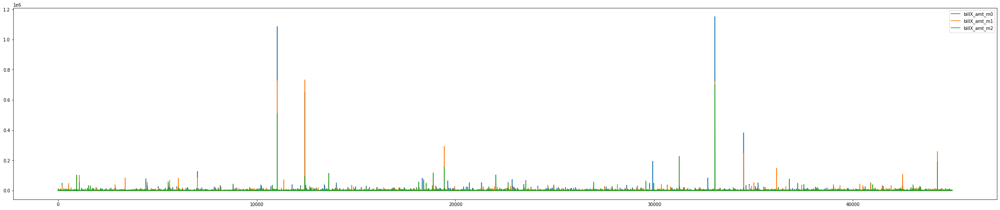

In [20]:
sum(df[bill_count_cols].apply(lambda x:  sum(x),axis=1)==0)
df[df.tot_billX_amt_m012>0][bill_amount_cols].plot(kind='line', figsize=(40,8))

In [21]:
#The above graph shows some of the outlier values for each column. Let's check outlier values, where outlier is defined as values beyond 99th percentile value of the feature.

In [22]:
df[df.tot_billX_amt_m012>0][bill_amount_cols+bill_count_cols+bill_derived_cols].quantile(np.arange(0.95,1,0.01))

,billX_amt_m0,billX_amt_m1,billX_amt_m2,billX_cnt_m0,billX_cnt_m1,billX_cnt_m2,tot_billX_amt_m012,r_billX_amt_m0_m1,r_billX_amt_m0_m12,r_billX_amt_m1_m2
0.95,3941.90,3611.90,3260.95,4.0,5.0,5.0,9722.95,137000.0,124000.0,150000.0
0.96,4580.00,4309.80,3900.00,5.0,6.0,6.0,11130.32,165000.0,174496.0,179832.0
0.97,5653.70,5266.22,4696.85,5.0,7.0,6.0,13199.37,214074.0,242000.0,224074.0
0.98,7230.90,6725.96,6207.00,7.0,9.0,8.0,16884.80,293580.0,349916.0,303958.0
0.99,10336.01,10716.91,9020.27,10.0,13.0,11.0,24671.79,471874.0,616424.0,499054.0
1.00,1152048.00,733640.00,703016.00,668.0,597.0,633.0,2577306.00,5103300.0,9938000.0,14813300.0


/opt/conda/lib/python3.7/site-packages/seaborn/axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


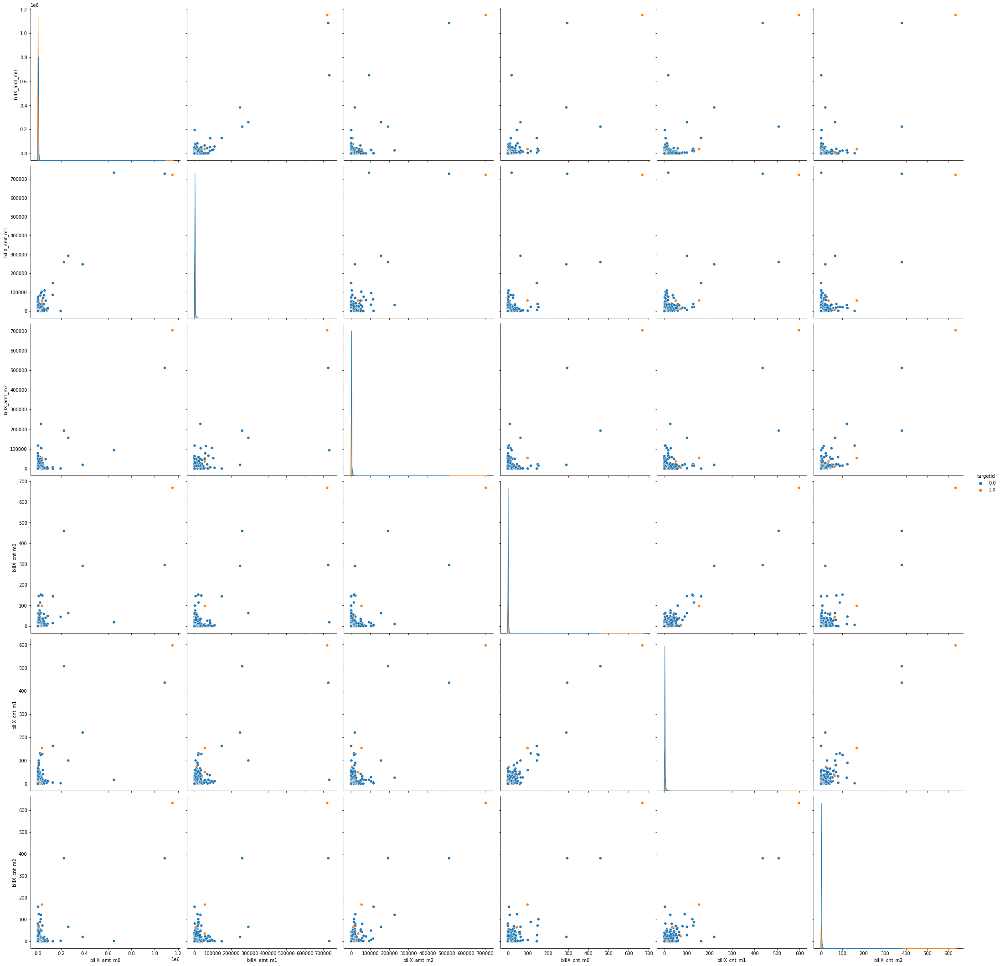

In [23]:
sns.pairplot(df[bill_amount_cols+bill_count_cols+['targetid']],hue='targetid',size=5)

* The diagonal plots of pairplot shows data distribution of each feature for both the target class. Although, the number of data points in churning class is less than non-churning class, leading to data imbalance, the data ditribution in both class still remains same, more or less. Hence, individual features don't have much prediction power with them.
* The plots on non-diagonal axis captures linear interaction between variables and it is evident that if we have some room for mis-classification, then a decision boundary can be drawn to separate churning and non-churning customers. Thus, we can safely say that, linear interaction of the two varibales possess some prediction power.

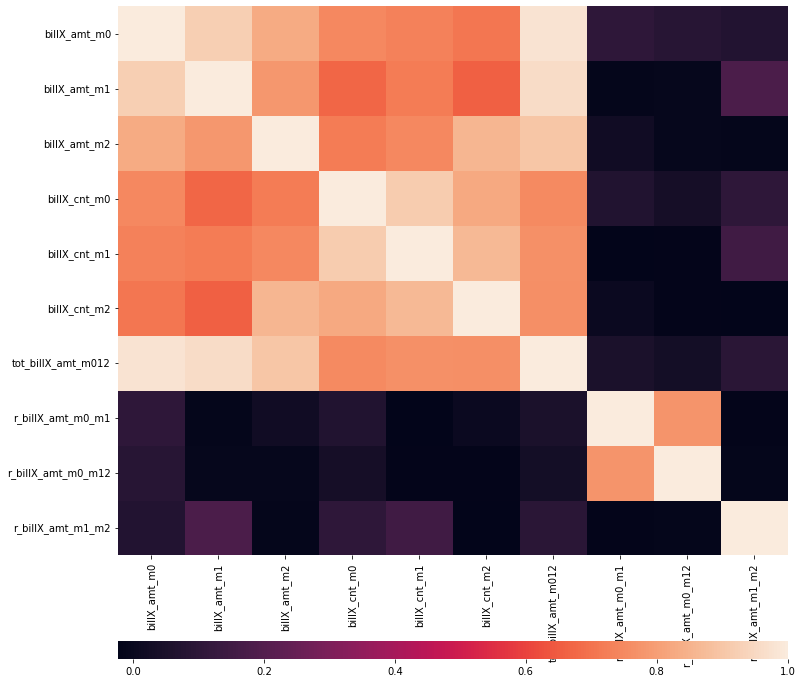

In [24]:
grid_kws = {"height_ratios": (.9, .03), "hspace": .3}
f, (ax, cbar_ax) = plt.subplots(2, gridspec_kw=grid_kws,figsize=(12,12))
ax = sns.heatmap(df[bill_amount_cols+bill_count_cols+bill_derived_cols].corr(), ax=ax,
                 cbar_ax=cbar_ax,
                 cbar_kws={"orientation": "horizontal"})

In [25]:
#Balance Analysis
balance_cols = [i for i in df.columns if i.startswith('avgbal')]
balance_cols

['avgbal_m0', 'avgbal_m1', 'avgbal_m2']

In [26]:
df[balance_cols].head()

,avgbal_m0,avgbal_m1,avgbal_m2
0,210.576667,128.410000,176.210357
1,119.172414,280.645161,0.000000
2,1.259310,535.180323,0.010000
3,948.210000,0.810000,80.810000
4,181.965517,244.000000,100.892857


In [27]:
df[balance_cols].describe()

,avgbal_m0,avgbal_m1,avgbal_m2
count,45000.000000,45000.000000,45000.000000
mean,332.705069,364.764067,312.915572
std,1576.631024,1600.786479,1737.374271
min,0.000000,0.000000,0.000000
25%,0.060000,0.260000,0.293929
50%,22.503000,31.307419,24.580536
75%,176.622655,224.611290,202.368571
max,62270.138810,100000.000000,242212.988800


### 
Feature Engineering : Total Balance over last 3 months, Average balance over last 3 months, Maximum monthly balance , Median monthly Balance, Standard deviation in balance,

<AxesSubplot:>

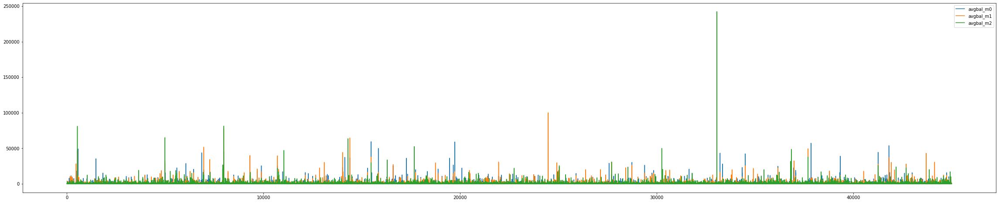

In [28]:

df[df[balance_cols].apply(lambda x : sum(x),axis=1)>0][balance_cols].plot(kind='line', figsize=(40,8))

The above graph shows some of the outlier values for each column. Let's check outlier values, where outlier is defined as values beyond 99th percentile value of the feature. This is much evident in feature avgbal_m2.

In [29]:
df[df[balance_cols].apply(lambda x : sum(x),axis=1)>0][balance_cols].quantile(np.arange(0.95,1,0.01))

,avgbal_m0,avgbal_m1,avgbal_m2
0.95,1501.383103,1726.634194,1476.593143
0.96,1864.051896,2093.202864,1785.083243
0.97,2361.349069,2612.868219,2216.877850
0.98,3330.521080,3539.868181,2888.916572
0.99,5397.557667,5365.666353,4381.202143
1.00,62270.138810,100000.000000,242212.988800


/opt/conda/lib/python3.7/site-packages/seaborn/axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


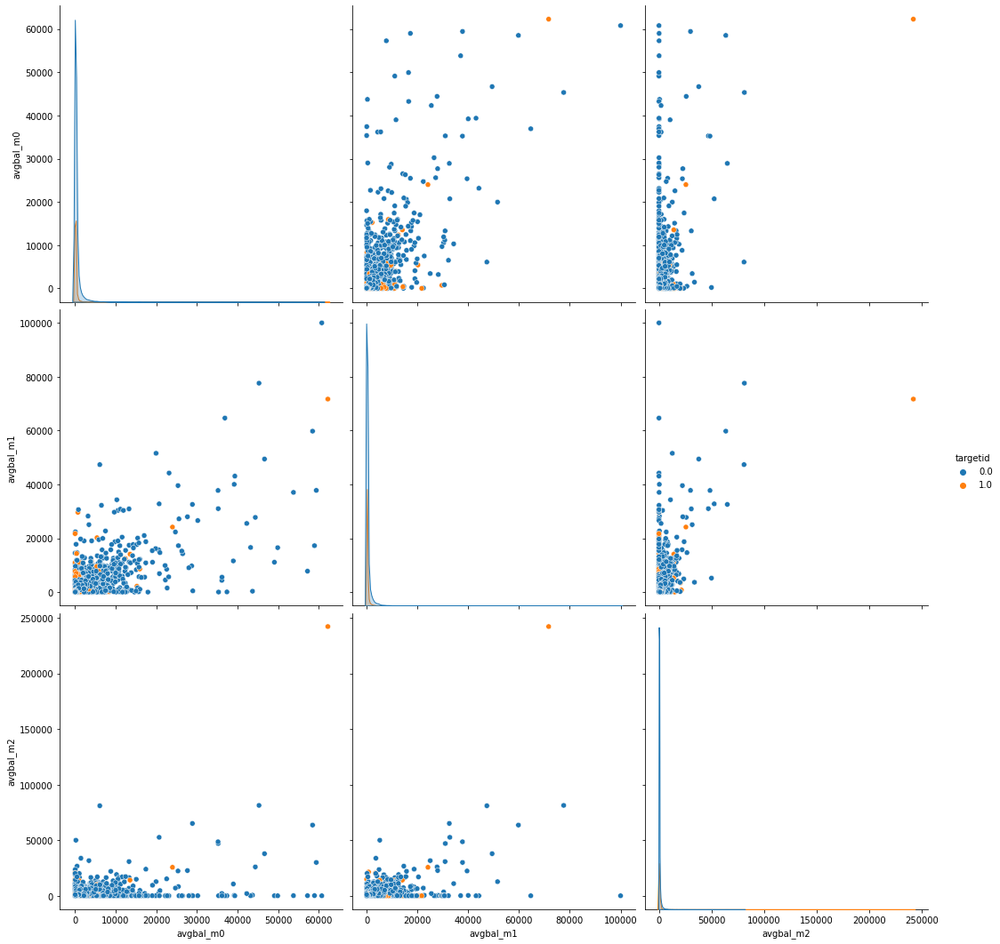

In [30]:
sns.pairplot(df[df[balance_cols].apply(lambda x : sum(x),axis=1)>0][balance_cols+['targetid']],hue='targetid',size=5)

The diagonal plots of pairplot shows data distribution of each feature for both the target class. Although, the number of data points in churning class is less than non-churning class, leading to data imbalance, the data ditribution in both class still remains same, more or less (high overlap). Hence, individual features don't have much prediction power with them.
The plots on non-diagonal axis captures linear interaction between variables and it is evident that if we have some room for mis-classification, then a decision boundary can be drawn to separate churning and non-churning customers. Thus, we can safely say that, linear interaction of the two varibales possess some prediction power except avgbal_m1 and avgbal_m2, where there is significant overlap between two classses of data in the linear interaction.

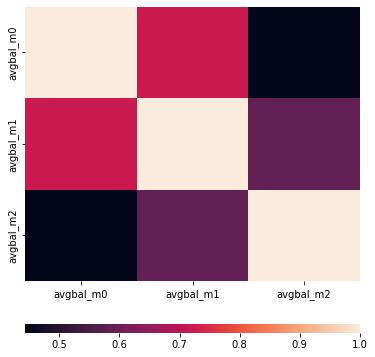

In [31]:
grid_kws = {"height_ratios": (.9, .03), "hspace": .3}
f, (ax, cbar_ax) = plt.subplots(2, gridspec_kw=grid_kws,figsize=(6,6))
ax = sns.heatmap(df[balance_cols].corr(), ax=ax,
                 cbar_ax=cbar_ax,
                 cbar_kws={"orientation": "horizontal"})

##There is high correlation among these group of variables, as can be read from the scale.

In [32]:
# RTL Analysis
rtl_columns = [i for i in df.columns if re.compile(r'rtl').search(i.lower()) ]
rtl_columns

['tot_rtlX_m0',
 'tot_rtlX_m1',
 'tot_rtlX_m2',
 'r_tot_rtlX_m0_m1',
 'r_tot_rtlX_m1_m2',
 'r_tot_rtlX_m0_m12',
 'avg_rtlX_m0',
 'avg_rtlX_m1',
 'avg_rtlX_m2',
 'max_rtlX_m0',
 'max_rtlX_m1',
 'max_rtlX_m2',
 'r_avg_max_rtlX_m0',
 'r_avg_max_rtlX_m1',
 'r_avg_max_rtlX_m2',
 'RtlTxns_cnt_m0',
 'RtlTxns_cnt_m1',
 'RtlTxns_cnt_m2',
 'r_RtlTxns_cnt_m0_m1',
 'r_RtlTxns_cnt_m1_m2',
 'sum_r_RtlTxns_cnt',
 'fail_RtlTxncnt_m0',
 'RtlTxn_dayscnt_m0',
 'RtlTxn_dayscnt_m1',
 'RtlTxn_dayscnt_m2']

In [33]:
df[rtl_columns]

,tot_rtlX_m0,tot_rtlX_m1,tot_rtlX_m2,r_tot_rtlX_m0_m1,r_tot_rtlX_m1_m2,r_tot_rtlX_m0_m12,avg_rtlX_m0,avg_rtlX_m1,avg_rtlX_m2,max_rtlX_m0,max_rtlX_m1,max_rtlX_m2,r_avg_max_rtlX_m0,r_avg_max_rtlX_m1,r_avg_max_rtlX_m2,RtlTxns_cnt_m0,RtlTxns_cnt_m1,RtlTxns_cnt_m2,r_RtlTxns_cnt_m0_m1,r_RtlTxns_cnt_m1_m2,sum_r_RtlTxns_cnt,fail_RtlTxncnt_m0,RtlTxn_dayscnt_m0,RtlTxn_dayscnt_m1,RtlTxn_dayscnt_m2
0,1010.0,0.00,240.00,1010.0,0.000000,4.190871,336.666667,0.00,120.0000,710.0,0.00,160.00,0.474178,-999.000000,0.750000,3.0,0.0,2.0,300.0,0.0,300.0,0.0,3.0,0.0,1.0
1,0.0,0.00,0.00,0.0,0.000000,0.000000,0.000000,0.00,0.0000,0.0,0.00,0.00,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,4105.59,0.00,0.0,4105.590000,0.000000,0.000000,1368.53,0.0000,0.0,1410.00,0.00,-999.000000,0.970589,-999.000000,0.0,3.0,0.0,0.0,300.0,300.0,0.0,0.0,3.0,0.0
3,0.0,0.00,0.00,0.0,0.000000,0.000000,0.000000,0.00,0.0000,0.0,0.00,0.00,-999.000000,-999.000000,-999.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.00,0.00,0.0,0.000000,0.000000,0.000000,0.00,0.0000,0.0,0.00,0.00,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44995,0.0,1311.20,1073.19,0.0,1.220641,0.000000,0.000000,327.80,268.2975,0.0,602.54,714.87,-999.000000,0.544030,0.375309,0.0,4.0,4.0,0.0,80.0,80.0,0.0,0.0,4.0,3.0
44996,0.0,0.00,0.00,0.0,0.000000,0.000000,0.000000,0.00,0.0000,0.0,0.00,0.00,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
44997,2263.5,0.00,1100.00,2263.5,0.000000,2.055858,754.500000,0.00,550.0000,800.0,0.00,550.00,0.943125,-999.000000,1.000000,3.0,0.0,2.0,300.0,0.0,300.0,0.0,2.0,0.0,2.0
44998,0.0,0.00,0.00,0.0,0.000000,0.000000,0.000000,0.00,0.0000,0.0,0.00,0.00,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [34]:
df[rtl_columns].describe()

,tot_rtlX_m0,tot_rtlX_m1,tot_rtlX_m2,r_tot_rtlX_m0_m1,r_tot_rtlX_m1_m2,r_tot_rtlX_m0_m12,avg_rtlX_m0,avg_rtlX_m1,avg_rtlX_m2,max_rtlX_m0,max_rtlX_m1,max_rtlX_m2,r_avg_max_rtlX_m0,r_avg_max_rtlX_m1,r_avg_max_rtlX_m2,RtlTxns_cnt_m0,RtlTxns_cnt_m1,RtlTxns_cnt_m2,r_RtlTxns_cnt_m0_m1,r_RtlTxns_cnt_m1_m2,sum_r_RtlTxns_cnt,fail_RtlTxncnt_m0,RtlTxn_dayscnt_m0,RtlTxn_dayscnt_m1,RtlTxn_dayscnt_m2
count,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.0,45000.000000,45000.000000,45000.000000
mean,1308.547745,1294.025466,1264.654441,236.873855,320.136893,110.124612,372.537317,363.549005,369.250088,627.508632,615.084332,659.442426,-217.393444,-247.552067,-253.243629,1.580356,1.559156,1.540333,48.118154,49.284161,97.402315,0.0,1.097844,1.108778,1.065778
std,6961.616004,6522.238685,4830.662543,2451.453742,3219.417740,2042.172249,1373.708662,1571.207860,1403.098082,2352.154724,2446.250554,2553.244746,412.549925,431.591151,434.854208,6.126222,5.005853,4.998381,367.055300,251.615019,446.489207,0.0,2.452918,2.541902,2.369055
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-999.000000,-999.000000,-999.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-999.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
75%,516.970000,530.910000,572.745000,0.760952,0.594551,0.315017,260.405000,245.100000,250.047500,358.775000,349.000000,362.880000,0.622908,0.518961,0.487749,1.000000,1.000000,1.000000,50.000000,50.000000,133.333333,0.0,1.000000,1.000000,1.000000
max,647013.570000,572796.000000,305280.000000,343212.120000,335282.000000,343212.120000,72695.000000,67056.400000,64990.000000,100000.000000,94779.000000,162000.000000,1.000000,1.000000,1.000000,716.000000,378.000000,568.000000,71600.000000,37800.000000,71600.000000,0.0,27.000000,31.000000,28.000000


In [35]:
df[rtl_columns].quantile(np.arange(0.95,1,0.01))

,tot_rtlX_m0,tot_rtlX_m1,tot_rtlX_m2,r_tot_rtlX_m0_m1,r_tot_rtlX_m1_m2,r_tot_rtlX_m0_m12,avg_rtlX_m0,avg_rtlX_m1,avg_rtlX_m2,max_rtlX_m0,max_rtlX_m1,max_rtlX_m2,r_avg_max_rtlX_m0,r_avg_max_rtlX_m1,r_avg_max_rtlX_m2,RtlTxns_cnt_m0,RtlTxns_cnt_m1,RtlTxns_cnt_m2,r_RtlTxns_cnt_m0_m1,r_RtlTxns_cnt_m1_m2,sum_r_RtlTxns_cnt,fail_RtlTxncnt_m0,RtlTxn_dayscnt_m0,RtlTxn_dayscnt_m1,RtlTxn_dayscnt_m2
0.95,6040.6550,5909.5275,6444.2380,805.0500,1038.3945,102.170735,1634.058375,1530.0470,1646.606625,2871.0045,2670.15,3127.6455,1.0,1.0,1.0,8.0,8.0,8.0,200.0,200.000000,357.142857,0.0,6.0,6.0,6.0
0.96,7249.2372,7119.0340,7853.4520,1118.8656,1407.8544,320.000000,1979.934000,1842.3907,1980.120000,3669.5592,3292.04,4005.0400,1.0,1.0,1.0,10.0,10.0,10.0,200.0,233.333333,400.000000,0.0,7.0,7.0,7.0
0.97,9291.7785,9000.1077,9490.0000,1613.8184,2020.9565,536.218200,2536.120000,2300.2678,2483.279500,5040.0600,4489.18,5200.0000,1.0,1.0,1.0,12.0,11.0,12.0,300.0,300.000000,480.000000,0.0,8.0,8.0,8.0
0.98,12732.8256,12117.1874,12971.7554,2597.5888,3134.3630,1000.000000,3546.530000,3192.0004,3334.983734,6999.0000,6764.06,7282.6100,1.0,1.0,1.0,15.0,14.0,14.0,320.0,400.000000,600.000000,0.0,10.0,10.0,9.0
0.99,19998.1100,20213.8584,19460.3149,5219.9626,6217.7950,2268.280000,6000.000000,5562.3273,5674.594021,10174.2500,10999.00,10999.0000,1.0,1.0,1.0,20.0,20.0,19.0,500.0,600.000000,800.000000,0.0,12.0,13.0,12.0
1.00,647013.5700,572796.0000,305280.0000,343212.1200,335282.0000,343212.120000,72695.000000,67056.4000,64990.000000,100000.0000,94779.00,162000.0000,1.0,1.0,1.0,716.0,378.0,568.0,71600.0,37800.000000,71600.000000,0.0,27.0,31.0,28.0


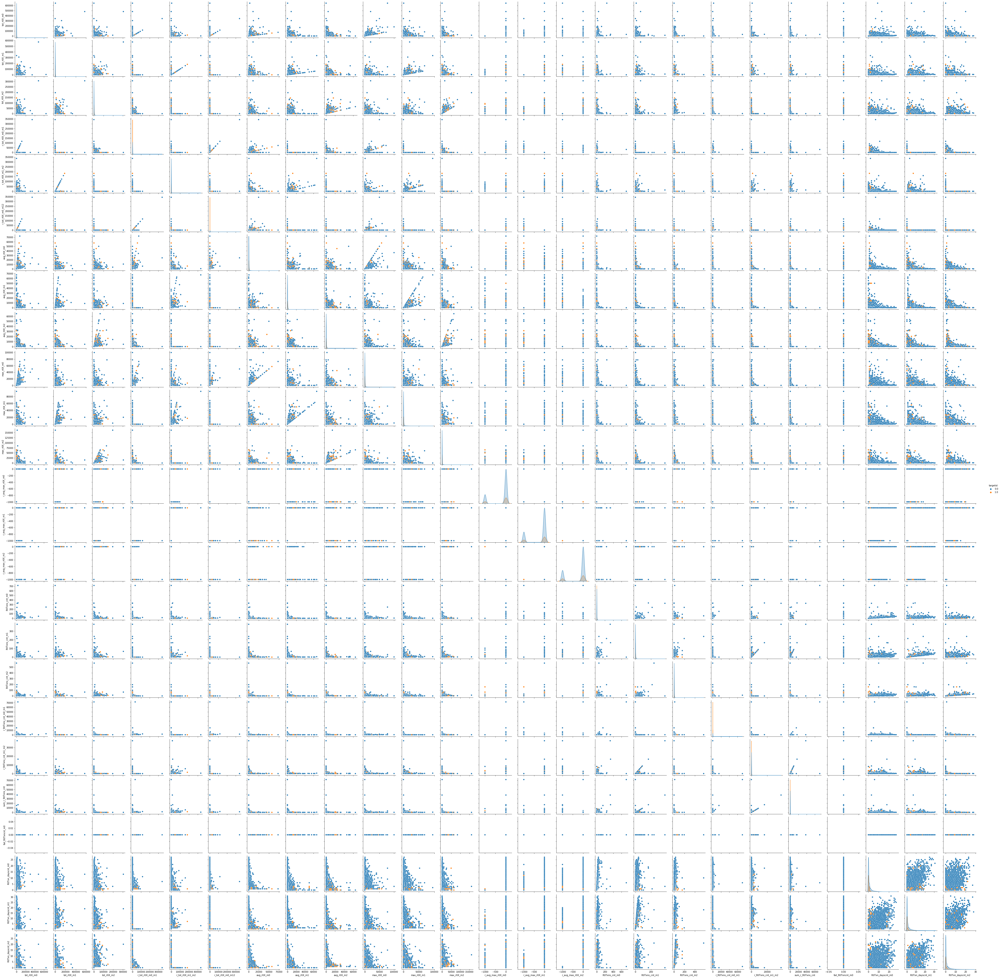

In [36]:
sns.pairplot(df[rtl_columns+['targetid']],hue='targetid')

#### the pairplot shows that although the individual features don't have much prediction power but the linear interaction of some of the features do have some prediction power

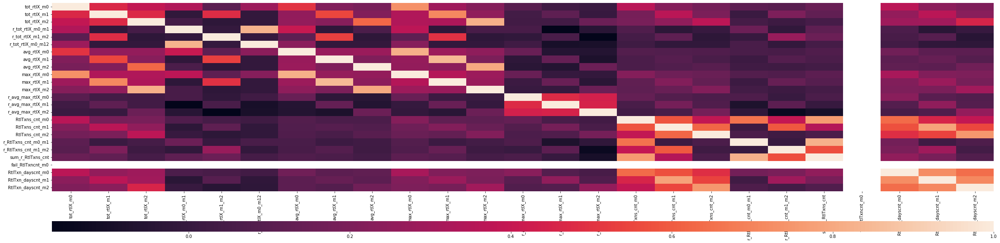

In [37]:
grid_kws = {"height_ratios": (.9, .05), "hspace": .3}
f, (ax, cbar_ax) = plt.subplots(2, gridspec_kw=grid_kws,figsize=(40,10))
ax = sns.heatmap(df[rtl_columns].corr(), ax=ax,
                 cbar_ax=cbar_ax,
                 cbar_kws={"orientation": "horizontal"})

There is high correlation among these group of variables, as can be read from the scale.

RECH Analysis

In [38]:
rech_columns = [i for i in df.columns if re.compile(r'rech').search(i.lower()) ]

In [39]:
df[rech_columns]

,tot_rechX_m0,tot_rechX_m1,tot_rechX_m2,chg_rechX_l0_1m,chg_rechX_l1_2m,avg_rechX_m0,avg_rechX_m1,avg_rechX_m2,max_rechX_m0,max_rechX_m1,max_rechX_m2,r_avg_max_rechX_m0,r_avg_max_rechX_m1,r_avg_max_rechX_m2,rechtxns_cnt_m0,rechtxns_cnt_m1,rechtxns_cnt_m2,rechtxn_dayscnt_m0,rechtxn_dayscnt_m1,rechtxn_dayscnt_m2,rech_amt_m0,rech_amt_m1,rech_amt_m2,r_rech_amt_m0_m1,r_rech_amt_m1_m2,sum_r_rech_amt_m1m2_m0m1,r_rech_amt_m0_m12
0,0.0,0.0,199.0,-999.000000,-100.000000,0.000000,0.000000,199.0,0.0,0.0,199.0,-999.000000,-999.000000,1.000000,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,199.0,0.000000,0.000000,0.000000,0.000000
1,1649.0,710.0,0.0,132.253521,-999.000000,549.666667,355.000000,0.0,1000.0,510.0,0.0,0.549667,0.696078,-999.000000,3.0,2.0,0.0,2.0,1.0,0.0,649.0,710.0,0.0,91.279887,71000.000000,71091.279890,182.559775
2,7.0,990.0,0.0,-99.292929,-999.000000,7.000000,141.428571,0.0,7.0,497.0,0.0,1.000000,0.284565,-999.000000,1.0,7.0,0.0,1.0,6.0,0.0,7.0,990.0,0.0,0.706357,99000.000000,99000.706360,1.412714
3,0.0,0.0,0.0,-999.000000,-999.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,-999.000000,-999.000000,-999.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
4,1637.0,0.0,10636.0,-999.000000,-100.000000,181.888889,0.000000,2659.0,399.0,0.0,5801.0,0.455862,-999.000000,0.458369,9.0,0.0,4.0,4.0,0.0,3.0,1637.0,0.0,0.0,163700.000000,0.000000,163700.000000,327400.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44995,11.0,184.0,306.0,-94.021739,-39.869281,11.000000,61.333333,61.2,11.0,109.0,199.0,1.000000,0.562691,0.307538,1.0,3.0,5.0,1.0,3.0,5.0,11.0,184.0,306.0,5.945946,59.934853,65.880799,4.480652
44996,238.0,831.0,619.0,-71.359807,34.248788,119.000000,118.714286,123.8,198.0,199.0,199.0,0.601010,0.596554,0.622111,2.0,7.0,5.0,2.0,5.0,4.0,238.0,831.0,619.0,28.605769,134.032258,162.638027,32.804962
44997,199.0,0.0,70.0,-999.000000,-100.000000,199.000000,0.000000,70.0,199.0,0.0,70.0,1.000000,-999.000000,1.000000,1.0,0.0,1.0,1.0,0.0,1.0,199.0,0.0,70.0,19900.000000,0.000000,19900.000000,560.563380
44998,131.0,1157.0,0.0,-88.677615,-999.000000,26.200000,128.555556,0.0,36.0,448.0,0.0,0.727778,0.286954,-999.000000,5.0,9.0,0.0,5.0,6.0,0.0,131.0,747.0,0.0,17.513369,74700.000000,74717.513370,35.026738


In [40]:
df[rech_columns].describe()

,tot_rechX_m0,tot_rechX_m1,tot_rechX_m2,chg_rechX_l0_1m,chg_rechX_l1_2m,avg_rechX_m0,avg_rechX_m1,avg_rechX_m2,max_rechX_m0,max_rechX_m1,max_rechX_m2,r_avg_max_rechX_m0,r_avg_max_rechX_m1,r_avg_max_rechX_m2,rechtxns_cnt_m0,rechtxns_cnt_m1,rechtxns_cnt_m2,rechtxn_dayscnt_m0,rechtxn_dayscnt_m1,rechtxn_dayscnt_m2,rech_amt_m0,rech_amt_m1,rech_amt_m2,r_rech_amt_m0_m1,r_rech_amt_m1_m2,sum_r_rech_amt_m1m2_m0m1,r_rech_amt_m0_m12
count,4.500000e+04,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,4.500000e+04,4.500000e+04,4.500000e+04,4.500000e+04
mean,9.316531e+02,897.301489,746.502844,-198.057258,-231.345336,271.328656,228.703439,203.316180,464.679867,421.022333,367.656222,-137.052919,-233.064915,-280.886196,3.057756,3.243133,2.843622,2.145156,2.191244,1.906289,360.001022,359.015311,294.164600,6.951099e+03,9.043898e+03,1.599500e+04,7.010797e+03
std,8.866272e+03,6884.031720,4958.506376,1729.616458,2580.521839,664.302988,661.040836,677.025323,1472.813349,1486.284211,1277.976228,344.528348,423.052427,449.605226,10.020922,9.967907,8.535757,2.588412,2.850412,2.581302,800.012160,795.756168,664.836501,2.737413e+04,3.629353e+04,4.406923e+04,3.715563e+04
min,0.000000e+00,0.000000,0.000000,-999.000000,-999.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-999.000000,-999.000000,-999.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.000000e+01,0.000000,0.000000,-999.000000,-999.000000,14.000000,0.000000,0.000000,18.000000,0.000000,0.000000,0.242411,0.000000,-999.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,4.525197e+01,0.000000e+00
50%,3.260000e+02,302.000000,200.000000,-69.386185,-91.198057,130.000000,105.000000,80.000000,199.000000,199.000000,120.000000,0.593134,0.464009,0.420927,2.000000,2.000000,1.000000,1.000000,1.000000,1.000000,120.000000,99.000000,35.000000,5.702641e+01,4.745877e+01,3.346243e+02,5.813953e+01
75%,8.200000e+02,835.000000,706.000000,10.611986,10.056116,324.500000,276.106250,241.270833,449.000000,429.000000,399.000000,1.000000,0.800159,0.787500,3.000000,4.000000,3.000000,3.000000,3.000000,3.000000,459.000000,475.000000,399.000000,2.918326e+02,3.375900e+02,1.270000e+04,1.995000e+02
max,1.152048e+06,733640.000000,703016.000000,149900.000000,468916.666700,34290.000000,71800.000000,93280.000000,87870.000000,96430.000000,93280.000000,1.000000,1.000000,1.000000,715.000000,752.000000,633.000000,30.000000,31.000000,28.000000,44486.000000,43224.000000,35974.000000,1.553000e+06,1.977500e+06,1.977538e+06,2.065800e+06


In [41]:
df[rech_columns].quantile(np.arange(0.95,1,0.01))

,tot_rechX_m0,tot_rechX_m1,tot_rechX_m2,chg_rechX_l0_1m,chg_rechX_l1_2m,avg_rechX_m0,avg_rechX_m1,avg_rechX_m2,max_rechX_m0,max_rechX_m1,max_rechX_m2,r_avg_max_rechX_m0,r_avg_max_rechX_m1,r_avg_max_rechX_m2,rechtxns_cnt_m0,rechtxns_cnt_m1,rechtxns_cnt_m2,rechtxn_dayscnt_m0,rechtxn_dayscnt_m1,rechtxn_dayscnt_m2,rech_amt_m0,rech_amt_m1,rech_amt_m2,r_rech_amt_m0_m1,r_rech_amt_m1_m2,sum_r_rech_amt_m1m2_m0m1,r_rech_amt_m0_m12
0.95,3229.00,3089.00,2798.05,423.367756,476.860750,932.508333,770.0000,720.000000,1620.00,1436.10,1314.05,1.0,1.0,1.0,9.0,10.0,10.0,7.0,7.0,7.0,1307.00,1366.00,1174.00,44900.0,53900.0,7.980000e+04,41800.0
0.96,3746.16,3579.00,3203.12,575.000000,625.759280,1067.520000,882.3400,819.000000,1940.00,1620.00,1500.00,1.0,1.0,1.0,10.0,12.0,11.0,7.0,8.0,7.0,1459.04,1516.00,1326.04,50000.0,62800.0,8.650400e+04,79800.0
0.97,4539.06,4372.21,3910.15,800.000000,872.000000,1263.838333,1024.5150,976.020000,2400.00,1981.03,1760.03,1.0,1.0,1.0,12.0,14.0,12.0,8.0,9.0,8.0,1685.00,1754.03,1540.00,59800.0,78900.0,9.988553e+04,79800.0
0.98,5826.08,5666.10,4952.18,1259.536936,1337.299082,1610.000000,1301.0250,1193.006667,3150.00,2560.12,2300.16,1.0,1.0,1.0,14.0,18.0,15.0,9.0,10.0,9.0,2044.02,2120.08,1886.04,79800.0,94700.0,1.216020e+05,99600.0
0.99,8579.11,8640.15,7431.05,2385.757143,2727.970163,2400.000000,1946.6875,1706.036667,4743.07,4156.04,3765.03,1.0,1.0,1.0,22.0,26.0,23.0,12.0,13.0,12.0,2866.01,2946.01,2580.10,107006.0,134202.0,1.679060e+05,159400.0
1.00,1152048.00,733640.00,703016.00,149900.000000,468916.666700,34290.000000,71800.0000,93280.000000,87870.00,96430.00,93280.00,1.0,1.0,1.0,715.0,752.0,633.0,30.0,31.0,28.0,44486.00,43224.00,35974.00,1553000.0,1977500.0,1.977538e+06,2065800.0


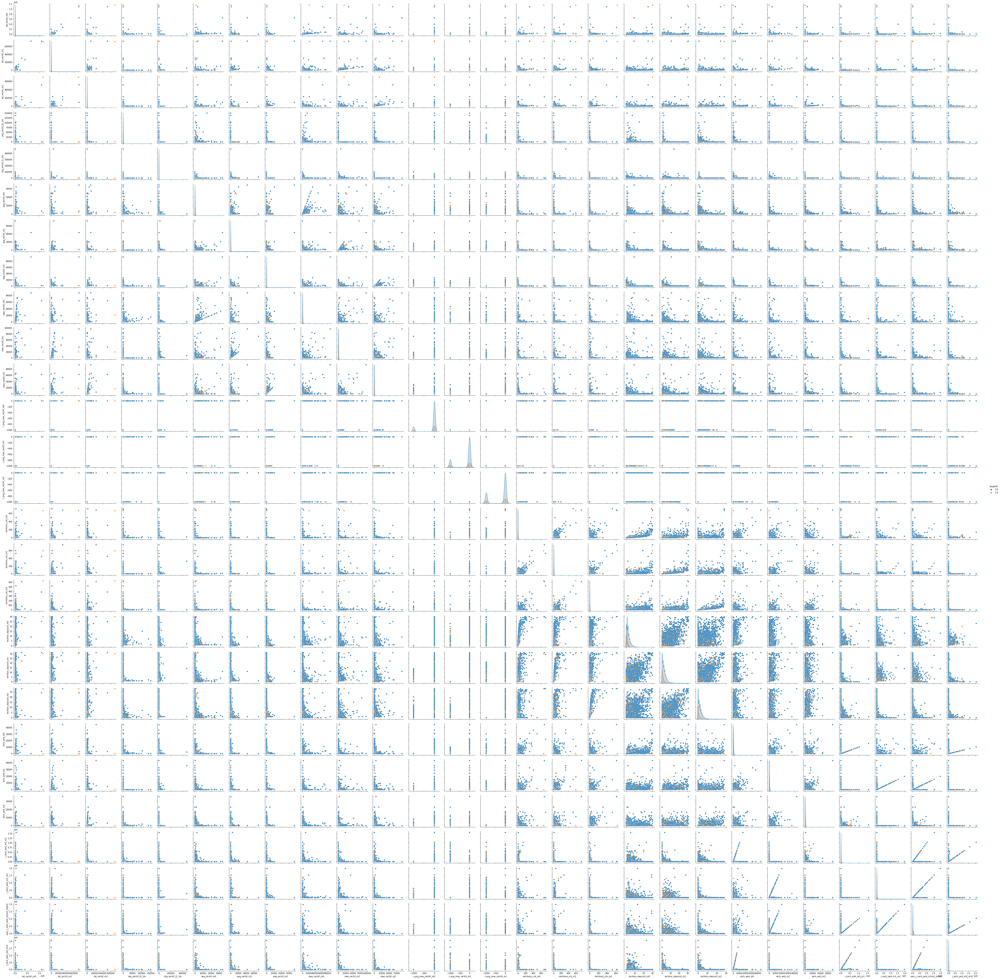

In [42]:
sns.pairplot(df[rech_columns+['targetid']],hue='targetid')

### The pairplot shows that although the individual features don't have much prediction power but the linear interaction of some of the features do have some prediction power.

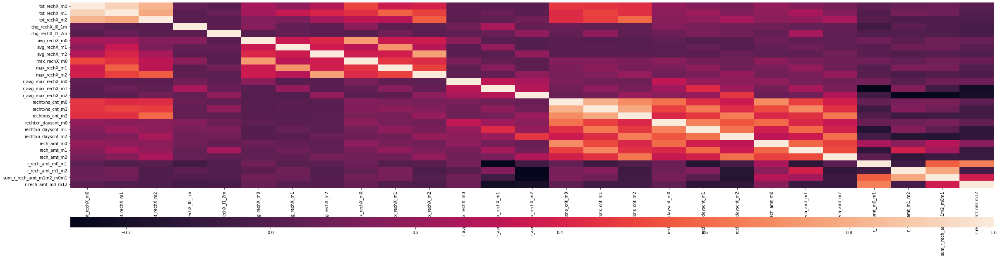

In [43]:
grid_kws = {"height_ratios": (.9, .05), "hspace": .3}
f, (ax, cbar_ax) = plt.subplots(2, gridspec_kw=grid_kws,figsize=(40,10))
ax = sns.heatmap(df[rech_columns].corr(), ax=ax,
                 cbar_ax=cbar_ax,
                 cbar_kws={"orientation": "horizontal"})

there is high correlation among these group of variables, as can be read from the scale.

REV Analysis

In [44]:
rev_columns = [i for i in df.columns if re.compile(r'rev').search(i.lower()) ]
print(rev_columns)

['tot_RevUo_m0', 'tot_RevUo_m1', 'tot_RevUo_m2', 'r_tot_RevUo_m0_m1', 'r_tot_RevUo_m1_m2', 'r_tot_RevUo_m0_m12', 'avg_RevUo_m0', 'avg_RevUo_m1', 'avg_RevUo_m2', 'chg_RevUo_l0_1m', 'chg_RevUo_l1_2m', 'chg_RevUo_l2_3m', 'max_RevUo_m0', 'max_RevUo_m1', 'max_RevUo_m2', 'r_avg_RevUo_m0_m1', 'r_avg_RevUo_m1_m2', 'InAllRev_m0', 'InAllRev_m1', 'InAllRev_m2', 'r_InAllRev_m0_m1', 'r_InAllRev_m0_m2', 'tot_InAllRev_3m', 'OgAllRev_m0', 'OgAllRev_m1', 'OgAllRev_m2', 'tot_OgAllRev_3m']


In [45]:
df[rev_columns]

,tot_RevUo_m0,tot_RevUo_m1,tot_RevUo_m2,r_tot_RevUo_m0_m1,r_tot_RevUo_m1_m2,r_tot_RevUo_m0_m12,avg_RevUo_m0,avg_RevUo_m1,avg_RevUo_m2,chg_RevUo_l0_1m,chg_RevUo_l1_2m,chg_RevUo_l2_3m,max_RevUo_m0,max_RevUo_m1,max_RevUo_m2,r_avg_RevUo_m0_m1,r_avg_RevUo_m1_m2,InAllRev_m0,InAllRev_m1,InAllRev_m2,r_InAllRev_m0_m1,r_InAllRev_m0_m2,tot_InAllRev_3m,OgAllRev_m0,OgAllRev_m1,OgAllRev_m2,tot_OgAllRev_3m
0,1299.0,0.0,500.00,129900.000000,0.000000,518.562874,324.75,0.000000,500.000000,-999.000000,-100.000000,-999.000000,500.0,0.0,500.0,32475.000000,0.000000,1299.0,0.0,500.00,129900.000000,259.281437,1799.00,1010.0,0.00,439.00,1449.00
1,0.0,1000.0,0.00,0.000000,100000.000000,0.000000,0.00,1000.000000,0.000000,-100.000000,-999.000000,-999.000000,0.0,1000.0,0.0,0.000000,100000.000000,0.0,1000.0,0.00,0.000000,0.000000,1000.00,1649.0,710.00,0.00,2359.00
2,0.0,0.0,0.00,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,-999.000000,-999.000000,-999.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.00,0.000000,0.000000,0.00,7.0,5095.59,0.00,5102.59
3,51500.0,3162.0,3000.00,1628.201075,105.364878,1671.263995,6437.50,1581.000000,3000.000000,1528.716003,5.400000,64.925783,10000.0,2162.0,3000.0,406.921618,52.682439,57363.0,3162.0,3000.00,1813.563073,1911.462846,63525.00,51910.0,3162.00,3320.00,58392.00
4,400.0,0.0,10700.00,40000.000000,0.000000,7.475937,400.00,0.000000,3566.666667,-999.000000,-100.000000,89.918353,400.0,0.0,6000.0,40000.000000,0.000000,400.0,0.0,10700.00,40000.000000,3.737968,11100.00,1637.0,0.00,10636.00,12273.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44995,0.0,600.0,2527.25,0.000000,23.731830,0.000000,0.00,600.000000,505.450000,-100.000000,-76.258779,-57.879167,0.0,600.0,1000.0,0.000000,118.471715,0.0,600.0,2527.25,0.000000,0.000000,3127.25,11.0,1895.20,4429.19,6335.39
44996,0.0,0.0,0.00,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,-999.000000,-999.000000,-999.000000,0.0,0.0,0.0,0.000000,0.000000,500.0,730.0,750.00,68.399453,66.577896,1980.00,238.0,831.00,619.00,1688.00
44997,2402.0,0.0,1079.00,240200.000000,0.000000,444.814815,600.50,0.000000,359.666667,-999.000000,-100.000000,62.500000,777.0,0.0,509.0,60050.000000,0.000000,2402.0,0.0,1079.00,240200.000000,222.407407,3481.00,2462.5,0.00,1170.00,3632.50
44998,0.0,1100.0,0.00,0.000000,110000.000000,0.000000,0.00,366.666667,0.000000,-100.000000,-999.000000,-999.000000,0.0,700.0,0.0,0.000000,36666.666670,0.0,1100.0,0.00,0.000000,0.000000,1100.00,131.0,1157.00,0.00,1288.00


In [46]:
df[rev_columns].describe()

,tot_RevUo_m0,tot_RevUo_m1,tot_RevUo_m2,r_tot_RevUo_m0_m1,r_tot_RevUo_m1_m2,r_tot_RevUo_m0_m12,avg_RevUo_m0,avg_RevUo_m1,avg_RevUo_m2,chg_RevUo_l0_1m,chg_RevUo_l1_2m,chg_RevUo_l2_3m,max_RevUo_m0,max_RevUo_m1,max_RevUo_m2,r_avg_RevUo_m0_m1,r_avg_RevUo_m1_m2,InAllRev_m0,InAllRev_m1,InAllRev_m2,r_InAllRev_m0_m1,r_InAllRev_m0_m2,tot_InAllRev_3m,OgAllRev_m0,OgAllRev_m1,OgAllRev_m2,tot_OgAllRev_3m
count,4.500000e+04,45000.000000,45000.000000,4.500000e+04,4.500000e+04,4.500000e+04,45000.000000,45000.000000,45000.000000,4.500000e+04,4.500000e+04,4.500000e+04,45000.000000,45000.000000,45000.000000,4.500000e+04,4.500000e+04,4.500000e+04,45000.000000,45000.000000,4.500000e+04,4.500000e+04,4.500000e+04,4.500000e+04,45000.000000,45000.000000,4.500000e+04
mean,2.488397e+03,2482.118184,2238.199012,4.629446e+04,6.175176e+04,3.423814e+04,846.444125,816.181492,749.370119,2.630596e+02,2.069284e+02,2.524503e+02,1355.497033,1309.591744,1221.237420,2.350631e+04,2.768194e+04,2.812807e+03,2717.330366,2393.321214,4.939508e+04,6.579752e+04,7.923458e+03,3.416837e+03,3175.460216,2814.560470,9.406858e+03
std,1.090275e+04,9282.490707,6825.280000,3.703412e+05,3.887604e+05,5.439108e+05,2436.598847,2379.900108,1852.430911,2.901125e+04,3.606705e+04,5.086184e+04,4190.260070,3828.231847,3020.836189,1.485797e+05,1.692845e+05,1.221962e+04,10310.885467,7113.361750,4.591941e+05,6.244168e+05,2.441495e+04,1.288049e+04,10783.370056,8131.856681,2.757466e+04
min,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,-9.990000e+02,-9.990000e+02,-9.990000e+02,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,5.000000e-01,0.000000,0.000000,1.000000e+00
25%,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,-9.990000e+02,-9.990000e+02,-9.990000e+02,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,4.990000e+02,2.780000e+02,200.000000,100.000000,1.163640e+03
50%,2.000000e+02,250.000000,377.000000,2.878412e+01,3.217163e+01,2.626864e+01,117.000000,130.000000,193.535714,-1.000000e+02,-1.000000e+02,-1.000000e+02,158.000000,200.000000,282.000000,4.434876e+01,4.656133e+01,2.300000e+02,300.000000,400.640000,3.331113e+01,3.215931e+01,1.715000e+03,7.440000e+02,728.370000,620.510000,2.788100e+03
75%,1.312003e+03,1500.000000,1548.000000,1.998668e+02,2.409467e+02,1.473193e+02,600.654167,624.000000,628.727313,-2.616573e+01,-2.000000e+01,-1.927312e+01,1000.000000,1000.000000,1000.000000,1.781449e+02,1.996008e+02,1.500000e+03,1600.000000,1724.075000,2.035472e+02,2.274004e+02,6.308462e+03,2.410000e+03,2383.707500,2296.000000,8.618500e+03
max,1.056800e+06,698900.000000,556440.000000,3.431150e+07,1.727060e+07,6.862300e+07,72671.300000,60000.000000,51000.000000,4.592243e+06,6.523429e+06,8.266567e+06,90037.000000,84000.000000,64885.000000,7.267130e+06,5.965300e+06,1.067200e+06,718900.000000,556440.000000,3.431150e+07,6.506785e+07,2.342540e+06,1.152048e+06,760763.250000,703016.000000,2.577306e+06


In [47]:
df[rev_columns].quantile(np.arange(0.95,1,0.01))

,tot_RevUo_m0,tot_RevUo_m1,tot_RevUo_m2,r_tot_RevUo_m0_m1,r_tot_RevUo_m1_m2,r_tot_RevUo_m0_m12,avg_RevUo_m0,avg_RevUo_m1,avg_RevUo_m2,chg_RevUo_l0_1m,chg_RevUo_l1_2m,chg_RevUo_l2_3m,max_RevUo_m0,max_RevUo_m1,max_RevUo_m2,r_avg_RevUo_m0_m1,r_avg_RevUo_m1_m2,InAllRev_m0,InAllRev_m1,InAllRev_m2,r_InAllRev_m0_m1,r_InAllRev_m0_m2,tot_InAllRev_3m,OgAllRev_m0,OgAllRev_m1,OgAllRev_m2,tot_OgAllRev_3m
0.95,1.144492e+04,11902.3995,10599.0520,144086.25,201219.25,20000.00,4500.00,4011.205555,3693.369166,3.124440e+02,3.542909e+02,3.270175e+02,6700.7125,5999.000,5450.125,1.000000e+05,1.053952e+05,1.310036e+04,13000.0000,11410.4310,130000.0,167752.75,3.700000e+04,1.500000e+04,14382.6250,12997.3905,4.053210e+04
0.96,1.450000e+04,14991.2576,13000.0000,200000.00,300000.00,70000.00,5000.00,4981.513920,4485.189700,4.125128e+02,4.555556e+02,4.300000e+02,8999.0400,7936.494,6999.000,1.110237e+05,1.526040e+05,1.550000e+04,15600.3228,14016.1560,197216.0,240000.00,4.350184e+04,1.809805e+04,16940.2800,15269.1200,4.708602e+04
0.97,1.800000e+04,18700.0000,16155.5071,300000.00,482556.05,110000.00,5665.05,5100.000000,5000.000000,6.061036e+02,6.500000e+02,6.000000e+02,10000.0000,10000.000,9000.000,1.800000e+05,2.118427e+05,2.000000e+04,20000.0000,17213.0597,290000.0,390000.00,5.184089e+04,2.171368e+04,20396.0951,18727.0300,5.487739e+04
0.98,2.394599e+04,24500.0000,20668.6400,515546.00,734802.40,200322.68,7500.00,6716.733334,6000.000000,1.000000e+03,1.033357e+03,9.526559e+02,10300.0000,10000.000,10000.000,3.000000e+05,3.500000e+05,2.560642e+04,25300.0000,22065.7000,500000.0,699813.76,6.518837e+04,2.822624e+04,25807.3162,23854.1200,6.677060e+04
0.99,3.650000e+04,35000.0000,28557.4696,1000000.00,1410000.00,620000.00,10000.00,10000.000000,8594.991100,2.545439e+03,2.640002e+03,2.449672e+03,16999.0000,15000.000,13928.971,5.100000e+05,5.100000e+05,4.000000e+04,36898.8121,30000.0000,1000000.0,1499900.00,9.047213e+04,4.130803e+04,37449.6900,31577.0300,8.808418e+04
1.00,1.056800e+06,698900.0000,556440.0000,34311501.00,17270600.00,68623002.00,72671.30,60000.000000,51000.000000,4.592243e+06,6.523429e+06,8.266567e+06,90037.0000,84000.000,64885.000,7.267130e+06,5.965300e+06,1.067200e+06,718900.0000,556440.0000,34311501.0,65067848.00,2.342540e+06,1.152048e+06,760763.2500,703016.0000,2.577306e+06


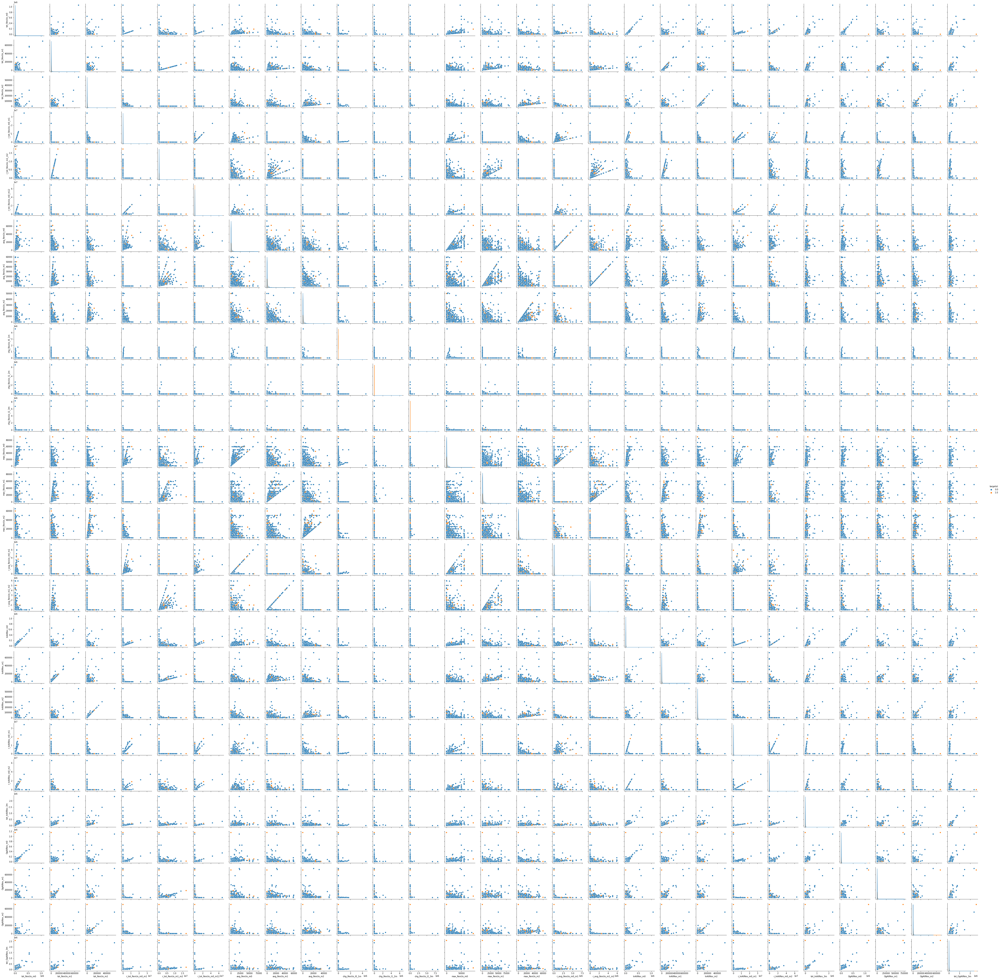

In [48]:
sns.pairplot(df[rev_columns+['targetid']],hue='targetid')

The pairplot shows that although the individual features don't have much prediction power but the linear interaction of some of the features do have some prediction power

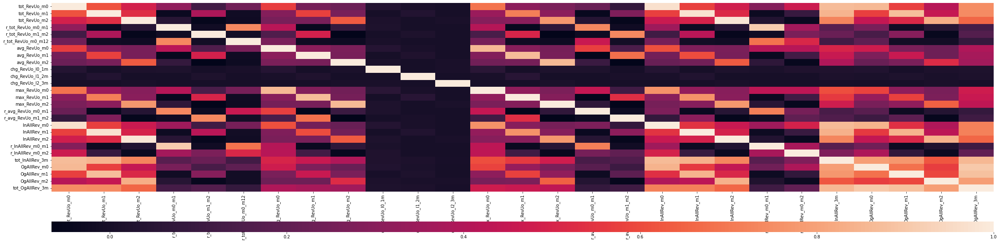

In [49]:
grid_kws = {"height_ratios": (.9, .05), "hspace": .3}
f, (ax, cbar_ax) = plt.subplots(2, gridspec_kw=grid_kws,figsize=(40,10))
ax = sns.heatmap(df[rev_columns].corr(), ax=ax,
                 cbar_ax=cbar_ax,
                 cbar_kws={"orientation": "horizontal"})

There is high correlation among these group of variables, as can be read from the scale.

**ACD, LD & RESOLVE Analysis**

In [50]:
alr_columns =  [i for i in df.columns if re.compile(r'acd').search(i.lower()) or re.compile(r'ld').search(i.lower()) or re.compile(r'resolve').search(i.lower()) ]

In [51]:
alr_columns

['num_AcD_m0',
 'num_AcD_m1',
 'r_AcD_m0_m12',
 'r_AcD_m0_m123',
 'tot_LdCnt_m0',
 'tot_LdCnt_m1',
 'tot_LdCnt_m2',
 'tot_failed_LdTxnCnt_3m',
 'r_failed_LdTxnCnt_m0_m12',
 'resolved_cnt_m2',
 'tot_resolved_cnt_m012',
 'percent_resolved_3m']

In [52]:
df[alr_columns].describe()

,num_AcD_m0,num_AcD_m1,r_AcD_m0_m12,r_AcD_m0_m123,tot_LdCnt_m0,tot_LdCnt_m1,tot_LdCnt_m2,tot_failed_LdTxnCnt_3m,r_failed_LdTxnCnt_m0_m12,resolved_cnt_m2,tot_resolved_cnt_m012,percent_resolved_3m
count,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000
mean,4.381578,4.592067,112.841890,118.753357,1.669556,1.863111,2.052267,2.459733,0.324377,0.118044,0.370044,9.633666
std,3.848722,4.166986,107.830697,103.650729,2.802959,3.149013,3.045362,5.855720,1.275611,0.609286,1.381963,23.132169
min,1.000000,0.000000,4.444444,4.285714,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,2.000000,56.187500,60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,3.000000,3.000000,88.888889,96.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
75%,6.000000,6.000000,133.333333,150.000000,2.000000,2.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000
max,30.000000,31.000000,4600.000000,3450.000000,93.000000,88.000000,54.000000,257.000000,137.000000,22.000000,89.000000,98.888889


In [53]:
df[alr_columns].quantile(np.arange(0.95,1,0.01))

,num_AcD_m0,num_AcD_m1,r_AcD_m0_m12,r_AcD_m0_m123,tot_LdCnt_m0,tot_LdCnt_m1,tot_LdCnt_m2,tot_failed_LdTxnCnt_3m,r_failed_LdTxnCnt_m0_m12,resolved_cnt_m2,tot_resolved_cnt_m012,percent_resolved_3m
0.95,12.0,13.0,280.000000,300.0,6.0,7.0,8.0,11.0,2.0,1.0,2.0,66.666667
0.96,13.0,14.0,300.000000,300.0,7.0,8.0,8.0,12.0,2.0,1.0,3.0,75.000000
0.97,15.0,15.0,333.333333,350.0,8.0,9.0,10.0,14.0,2.5,1.0,3.0,75.000000
0.98,16.0,17.0,400.000000,400.0,10.0,11.0,11.0,17.0,3.0,2.0,4.0,80.000000
0.99,19.0,20.0,500.000000,525.0,13.0,14.0,14.0,24.0,5.0,3.0,6.0,85.714286
1.00,30.0,31.0,4600.000000,3450.0,93.0,88.0,54.0,257.0,137.0,22.0,89.0,98.888889


The pairplot shows that although the individual features don't have much prediction power but the linear interaction of some of the features do have some prediction power.

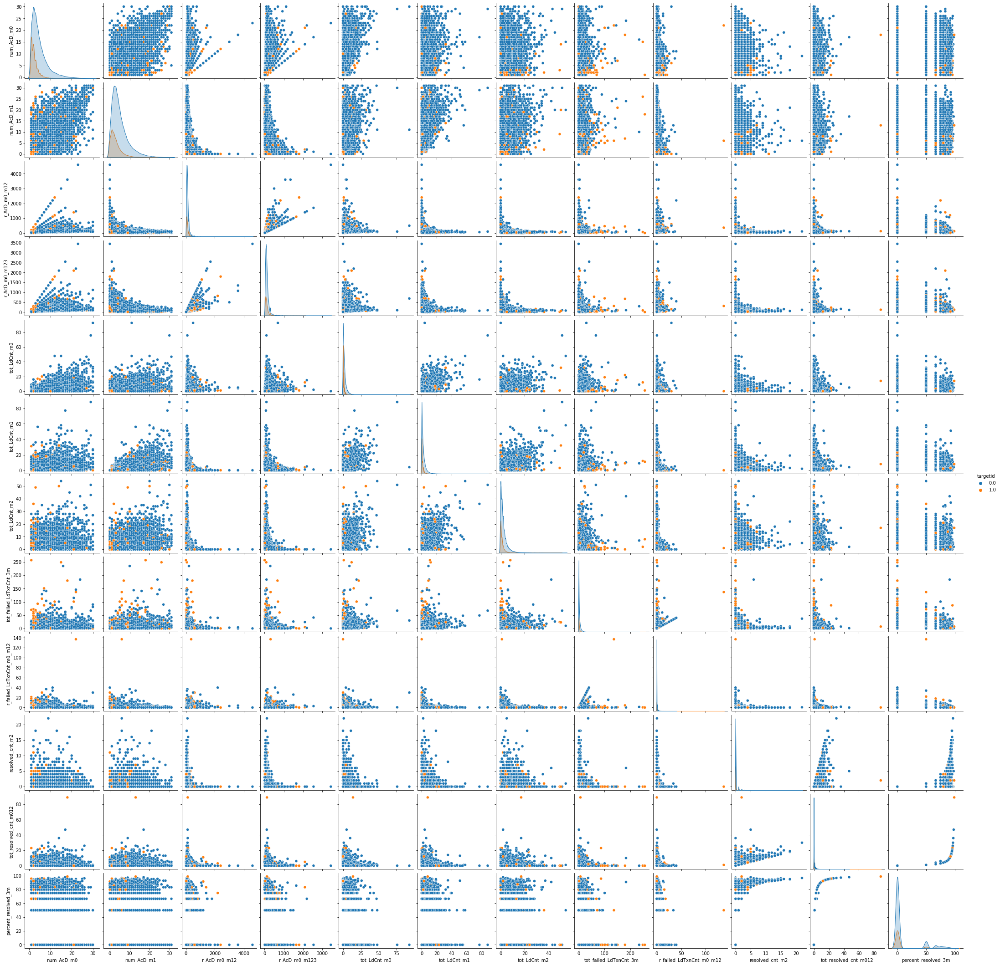

In [54]:
sns.pairplot(df[alr_columns+['targetid']],hue='targetid')

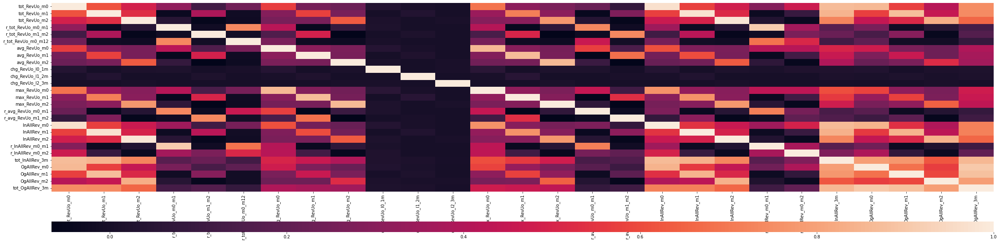

In [55]:
grid_kws = {"height_ratios": (.9, .05), "hspace": .3}
f, (ax, cbar_ax) = plt.subplots(2, gridspec_kw=grid_kws,figsize=(40,10))
ax = sns.heatmap(df[rev_columns].corr(), ax=ax,
                 cbar_ax=cbar_ax,
                 cbar_kws={"orientation": "horizontal"})

There is high correlation among these group of variables, as can be read from the scale.

We need outlier treatment for more generalised model, if target is not significantly influenced by outliers. We will be treating 1% thresold (500 data points) for outlier treatment

Mirror Image Analysis : Let's see effect of outliers & non-outliers on churning of customer to help us understand whether we need outlier treatment.

In [56]:
def outlier_effect(column):
    normal_group = df[df[column]<= df[column].quantile(0.99)]['targetid']
    outlier_group = df[df[column]> df[column].quantile(0.99)]['targetid']
    temp = pd.concat([pd.DataFrame(normal_group.value_counts().values, index=['norm_churn_0', 'norm_churn_1']).apply(lambda x : x*100 / len(normal_group)), pd.DataFrame(outlier_group.value_counts().values,index=['out_churn_0', 'out_churn_1']).apply(lambda x : x*100 / len(outlier_group))])
    temp.columns=[column]
    return temp.T

In [58]:
outlier_df=pd.DataFrame()
for i in set(df.columns)- set(inspection_cols)-set(missing_val_columns)-set(drop_Columns)-set(['targetid']):
    temp = outlier_effect(i)
    outlier_df=pd.concat([outlier_df,temp])
outlier_df

,norm_churn_0,norm_churn_1,out_churn_0,out_churn_1
avg_rtlX_m2,79.607183,20.392817,81.777778,18.222222
r_tot_RevUo_m1_m2,79.587439,20.412561,83.741648,16.258352
avg_rechX_m2,79.591470,20.408530,83.333333,16.666667
OgAllRev_m0,79.481481,20.518519,94.222222,5.777778
billX_cnt_m1,79.523201,20.476799,92.411924,7.588076
...,...,...,...,...
avg_RevUo_m1,79.582185,20.417815,85.012920,14.987080
chg_RevUo_l1_2m,79.557800,20.442200,86.666667,13.333333
chg_rechX_l0_1m,79.551066,20.448934,87.333333,12.666667
num_AcD_m0,79.468252,20.531748,96.279070,3.720930


Text(0.5, 1.0, 'Mirror Image Analyis : Outlier effects of a feature on Target ')

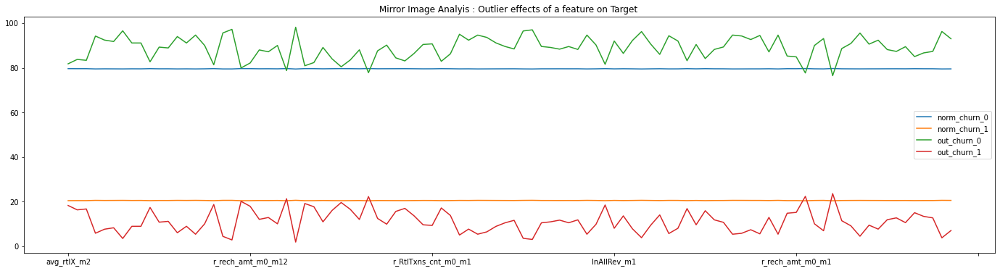

In [59]:
outlier_df.plot(kind = 'line', figsize=(24,6));
plt.title('Mirror Image Analyis : Outlier effects of a feature on Target ')

The mirror image analysis shows that Outliers of every feature have significant influence on the target and hence it would be unwise to perform value capping as outlier treatment. In such scenario, we should choose tree models as our way forward.

****EDA Observations and Next Steps


- We are not goig to do outlier treatment,as outliers defined above(99th percentile) have significant impact on the target class.
- drop the identified columns with constant values.
- we need to go ahead with missinig value imputation.
- Linear interactions of the varibale have significant prediction power.
- But, we can not go ahead with linear models, as that will be highly influenced by outliers in the data.
- we will be using following models as part of pipeline : RandomForest, Xgboost, GradientBoosting, Adaboost,KNN
- Model optimization method used will be :  BayesianOptimization.
- cross validation will be doone using 5 fold cv.
- data imbalance will be handled using class weight parameters of the models.
- we will be using 3 sets of data for training, testing and validation.

#### Evaluation Metrics for model training : ROC-AUC [which tells how much the model has learnt to distinguish between two classes of the target feature]
#### Threshold setting based on : Re-call of Churning Class (1) because we need to pick on all actual churners from the platform.



In [60]:
# drop identified columns during eda
def feature_selector_from_raw_data(df,drop_columns):
    if any(pd.Series(df.columns).isin(drop_columns)):
        print('dropping columns : {}'.format(drop_columns))
        X = df.drop(drop_columns,axis=1)
    else:
        X = df
    return X
        

In [61]:
X = feature_selector_from_raw_data(df,drop_Columns)
X.shape

dropping columns : ['avgdays_btw_loads_l6', 'fail_RtlTxncnt_m0']


(45000, 110)

In [62]:
# identifying target and identifiers 
target = 'targetid'
identifiers = ['userID']
#  drop from predictor set
identifiers.append(target)


In [64]:
# segregating predictors and target
X_final = feature_selector_from_raw_data(X,identifiers)
Y_final = df[target]
print('shape of predictor set:',X_final.shape)
print('shape of target:',len(Y_final))

dropping columns : ['userID', 'targetid']
shape of predictor set: (45000, 108)
shape of target: 45000


In [65]:
X_train, X_test, y_train, y_test = train_test_split(X_final, Y_final, test_size=0.3,stratify=Y_final)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.5,stratify=y_test)

In [66]:
print (X_train.shape, y_train.shape)
print (X_test.shape, y_test.shape)
print (X_val.shape, y_val.shape)

(31500, 108) (31500,)
(6750, 108) (6750,)
(6750, 108) (6750,)


In [67]:
sum([any(X_train[i]==-999) for i in  X_train.columns])

15

In [68]:
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(missing_values=-999,strategy='mean'))])

In [69]:
numeric_features = X_train.columns
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features)])

In [70]:
rf = Pipeline(steps=[('preprocessor', preprocessor)])

In [71]:
X_train_imputed = rf.fit_transform(X_train)
X_test_imputed = rf.fit_transform(X_test)

In [72]:
classifiers = [
    KNeighborsClassifier(3),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    AdaBoostClassifier(),
    GradientBoostingClassifier(),
    XGBClassifier()
    ]

In [73]:
for classifier in classifiers:
    pipe = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', classifier)])
    pipe.fit(X_train, y_train)   
    print(classifier)
    print("model score: %.3f" % pipe.score(X_test, y_test))
    print("model score: %.3f" % pipe.score(X_train, y_train))

KNeighborsClassifier(n_neighbors=3)
model score: 0.759
model score: 0.859
DecisionTreeClassifier()
model score: 0.821
model score: 1.000
RandomForestClassifier()
model score: 0.855
model score: 1.000
AdaBoostClassifier()
model score: 0.848
model score: 0.848
GradientBoostingClassifier()
model score: 0.861
model score: 0.869
XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alp

In [74]:
# Fit the model
#result = bayes_cv_tuner.fit(X_train_imputed, y_train.values, callback=status_print)
#Choosing best XGBoost Parameters for model preparation using Bayesian Optimization
ITERATIONS=10
space={ 'learning_rate': (0.01, 1.0, 'log-uniform'),
        'min_child_weight': (0, 10),
        'max_depth': (0, 50),
        'max_delta_step': (0, 20),
        'subsample': (0.01, 1.0, 'uniform'),
        'colsample_bytree': (0.01, 1.0, 'uniform'),
        'colsample_bylevel': (0.01, 1.0, 'uniform'),
        'reg_lambda': (1e-9, 1000, 'log-uniform'),
        'reg_alpha': (1e-9, 1.0, 'log-uniform'),
        'gamma': (1e-9, 0.5, 'log-uniform'),
        'n_estimators': (50, 1000),
        'scale_pos_weight': (1e-6, 50, 'log-uniform') }

In [75]:
# Classifier
bayes_cv_tuner = BayesSearchCV(estimator = xgb.XGBClassifier(n_jobs = 1,objective = 'binary:logistic',
                                                             eval_metric = 'auc',silent=1),search_spaces = space,
                               scoring = 'roc_auc',cv = StratifiedKFold(n_splits=5,shuffle=True,random_state=42),
                               n_jobs = -1,n_iter = ITERATIONS,verbose = 0,refit = True,random_state = 42)


In [76]:
def status_print(optim_result):      
    best_params = pd.Series(bayes_cv_tuner.best_params_)
    print('Model {} ROC-AUC: {}\n  params: {}\n'.format(
        np.round(bayes_cv_tuner.best_score_, 2),
        bayes_cv_tuner.best_params_))

In [78]:
#Listing optimal parameters for our first version of model
optimal_params = {'colsample_bylevel': 0.7366877378057127,
                  'colsample_bytree': 0.9399760402267441, 
                  'gamma': 2.6498051478267012e-08,
                  'learning_rate': 0.0238149998729586,
                  'max_delta_step': 16,
                  'max_depth': 19, 
                  'min_child_weight': 2,
                  'n_estimators': 764,
                  'reg_alpha': 0.011683028450342707,
                  'reg_lambda': 0.0048879464985534336,
                  'scale_pos_weight': 0.13267482411031659,
                  'subsample': 0.5689543694097536}
optimal_params['eval_metric'] = 'auc'
optimal_params['n_jobs'] = -1
optimal_params['objective'] = 'binary:logistic'
optimal_params['tree_method'] = 'approx'
optimal_params['verbose'] = 0
optimal_params['importance_type'] = 'gain'
optimal_params['missing'] = -999

In [79]:
clf = xgb.XGBClassifier(n_estimators = optimal_params['n_estimators'], 
                        max_depth = optimal_params['max_depth'],
                        min_child_weight = optimal_params['min_child_weight'],
                        subsample = optimal_params['subsample'],
                        colsample_bylevel = optimal_params['colsample_bylevel'],
                        gamma = optimal_params['gamma'],
                        colsample_bytree = optimal_params['colsample_bytree'],
                        learning_rate = optimal_params['learning_rate'],
                        max_delta_step = optimal_params['max_delta_step'],
                        reg_alpha = optimal_params['reg_alpha'],
                       reg_lambda = optimal_params['reg_lambda'],
                       scale_pos_weight = optimal_params['scale_pos_weight'],
                       importance_type = optimal_params['importance_type'],
                       missing = optimal_params['missing'],
                       seed=42)

In [81]:
clf = xgb.XGBModel(**optimal_params)

clf.fit(X_train_imputed, y_train.values,
        eval_set=[(X_train_imputed, y_train.values), (X_test_imputed, y_test.values)],
       
        early_stopping_rounds =20,
        verbose=True)

evals_result = clf.evals_result()

/opt/conda/lib/python3.7/site-packages/xgboost/sklearn.py:797: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  UserWarning,


[10:37:03] WARNING: ../src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.91598	validation_1-auc:0.83996
[1]	validation_0-auc:0.93761	validation_1-auc:0.86298
[2]	validation_0-auc:0.94448	validation_1-auc:0.88706
[3]	validation_0-auc:0.94717	validation_1-auc:0.88822
[4]	validation_0-auc:0.94968	validation_1-auc:0.88136
[5]	validation_0-auc:0.95189	validation_1-auc:0.88523
[6]	validation_0-auc:0.95323	validation_1-auc:0.88350
[7]	validation_0-auc:0.95412	validation_1-auc:0.88506
[8]	validation_0-auc:0.95470	validation_1-auc:0.88600
[10:31:38] WARNING: ../src/learner.cc:627: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by

<AxesSubplot:>

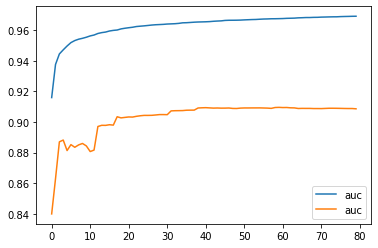

In [82]:
pd.concat([pd.DataFrame(evals_result['validation_0']),pd.DataFrame(evals_result['validation_1'])], axis=1).plot()

In [83]:
clf.get_params()

{'base_score': 0.5,
 'booster': 'gbtree',
 'callbacks': None,
 'colsample_bylevel': 0.7366877378057127,
 'colsample_bynode': 1,
 'colsample_bytree': 0.9399760402267441,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': 'auc',
 'gamma': 2.6498051478267012e-08,
 'gpu_id': -1,
 'grow_policy': 'depthwise',
 'importance_type': 'gain',
 'interaction_constraints': '',
 'learning_rate': 0.0238149998729586,
 'max_bin': 256,
 'max_cat_to_onehot': 4,
 'max_delta_step': 16,
 'max_depth': 19,
 'max_leaves': 0,
 'min_child_weight': 2,
 'missing': -999,
 'monotone_constraints': '()',
 'n_estimators': 764,
 'n_jobs': -1,
 'num_parallel_tree': 1,
 'objective': 'binary:logistic',
 'predictor': 'auto',
 'random_state': 0,
 'reg_alpha': 0.011683028450342707,
 'reg_lambda': 0.0048879464985534336,
 'sampling_method': 'uniform',
 'scale_pos_weight': 0.13267482411031659,
 'subsample': 0.5689543694097536,
 'tree_method': 'approx',
 'validate_parameters': 1,
 'verbosity': None,
 'ver

In [84]:
feature_imp  = pd.DataFrame([X_train.columns,clf.feature_importances_]).T
feature_imp.columns=['predictor','importance']
feature_imp.sort_values('importance',ascending=False)

,predictor,importance
8,dayssincelastload,0.082093
72,rechtxn_dayscnt_m0,0.057329
3,num_AcD_m0,0.02545
24,max_RevUo_m0,0.022017
69,rechtxns_cnt_m0,0.020563
...,...,...
81,r_billX_amt_m1_m2,0.003788
79,r_billX_amt_m0_m1,0.003637
97,percent_resolved_3m,0.003615
96,tot_resolved_cnt_m012,0.002204


In [86]:
pred_train = clf.predict(X_train_imputed)
y_train_pred = np.where(pd.Series(pred_train) > 0.004, 1,0)
pd.DataFrame({'predicted_probabilities':pred_train,'predicted':y_train_pred,'actual':y_train}).to_csv('train_thresold.csv',index= False)
from sklearn.metrics import classification_report
print(classification_report(y_train, y_train_pred))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00     25083
         1.0       0.20      1.00      0.34      6417

    accuracy                           0.20     31500
   macro avg       0.10      0.50      0.17     31500
weighted avg       0.04      0.20      0.07     31500



/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [87]:
pred_test = clf.predict(X_test_imputed)
y_test_pred = np.where(pd.Series(pred_test) > 0.004, 1,0)
pd.DataFrame({'predicted_probabilities':pred_test,'predicted':y_test_pred,'actual':y_test}).to_csv('test_thresold.csv',index= False)
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00      5375
         1.0       0.20      1.00      0.34      1375

    accuracy                           0.20      6750
   macro avg       0.10      0.50      0.17      6750
weighted avg       0.04      0.20      0.07      6750



/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [88]:
X = np.vstack((X_train_imputed,X_test_imputed))
Y = np.hstack((y_train,y_test))

In [90]:
clf = xgb.XGBModel(**optimal_params)

clf.fit(X, Y,
        eval_set=[(X,Y)],       
        early_stopping_rounds =20,
        verbose=True)

evals_result = clf.evals_result()

/opt/conda/lib/python3.7/site-packages/xgboost/sklearn.py:797: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  UserWarning,


[10:40:21] WARNING: ../src/learner.cc:627: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.92332
[1]	validation_0-auc:0.93838
[2]	validation_0-auc:0.94577
[3]	validation_0-auc:0.94904
[4]	validation_0-auc:0.95127
[5]	validation_0-auc:0.95275
[6]	validation_0-auc:0.95397
[7]	validation_0-auc:0.95484
[8]	validation_0-auc:0.95585
[9]	validation_0-auc:0.95660
[10]	validation_0-auc:0.95721
[11]	validation_0-auc:0.95757
[12]	validation_0-auc:0.95831
[13]	validation_0-auc:0.95893
[14]	validation_0-auc:0.95929
[15]	validation_0-auc:0.95975
[16]	validation_0-auc:0.96022
[17]	validation_0-auc:0.96050
[18]	validation_0-auc:0.96129
[19]	validation_0-auc:0.96146
[20]	validation_0-auc:0.96174
[21]	validation_0-auc:

In [91]:
X_val_imputed = rf.fit_transform(X_val)
pred_val = clf.predict(X_val_imputed)
y_val_pred = np.where(pd.Series(pred_val) > 0.004, 1,0)
pd.DataFrame({'predicted_probabilities':pred_val,'predicted':y_val_pred,'actual':y_val}).to_csv('val_thresold.csv',index= False)
print(classification_report(y_val, y_val_pred))

              precision    recall  f1-score   support

         0.0       0.99      0.65      0.79      5375
         1.0       0.42      0.98      0.59      1375

    accuracy                           0.72      6750
   macro avg       0.71      0.82      0.69      6750
weighted avg       0.88      0.72      0.75      6750



In [92]:
## Do Validations

# 1. Preprocess the data
# 2. Predict on the clf model!!

In [101]:
val_data_path = r'../input/churnprediction/DS_Assignment_Validation_Set (1).xlsx'
val_df = pd.DataFrame(pd.read_excel(val_data_path))
val_X = feature_selector_from_raw_data(val_df,drop_Columns)
val_X.shape

(5000, 111)

In [102]:
#Get missing columns
val_X.columns[val_X.isna().sum()>0]
val_missing_val_columns  = ['r_avg_max_rtlX_m0', 'r_avg_max_rtlX_m1', 'r_avg_max_rtlX_m2',
       'r_RtlTxns_cnt_m0_m1', 'r_RtlTxns_cnt_m1_m2', 'sum_r_RtlTxns_cnt',
       'RtlTxn_dayscnt_m0', 'RtlTxn_dayscnt_m1', 'RtlTxn_dayscnt_m2',
       'tot_rechX_m0', 'tot_rechX_m1', 'tot_rechX_m2', 'chg_rechX_l0_1m',
       'chg_rechX_l1_2m', 'avg_rechX_m0', 'avg_rechX_m1', 'avg_rechX_m2',
       'max_rechX_m0', 'max_rechX_m1', 'max_rechX_m2', 'r_avg_max_rechX_m0',
       'r_avg_max_rechX_m1', 'r_avg_max_rechX_m2', 'rechtxns_cnt_m0',
       'rechtxns_cnt_m1', 'rechtxns_cnt_m2', 'rechtxn_dayscnt_m0',
       'rechtxn_dayscnt_m1', 'rechtxn_dayscnt_m2', 'billX_amt_m0',
       'billX_amt_m1', 'billX_amt_m2', 'tot_billX_amt_m012',
       'r_billX_amt_m0_m1', 'r_billX_amt_m0_m12', 'r_billX_amt_m1_m2',
       'billX_cnt_m0', 'billX_cnt_m1', 'billX_cnt_m2', 'rech_amt_m0',
       'rech_amt_m1', 'rech_amt_m2', 'r_rech_amt_m0_m1', 'r_rech_amt_m1_m2',
       'sum_r_rech_amt_m1m2_m0m1', 'r_rech_amt_m0_m12', 'avgbal_m0',
       'avgbal_m1', 'avgbal_m2', 'resolved_cnt_m2', 'tot_resolved_cnt_m012',
       'percent_resolved_3m', 'InAllRev_m0', 'InAllRev_m1', 'InAllRev_m2',
       'r_InAllRev_m0_m1', 'r_InAllRev_m0_m2', 'tot_InAllRev_3m',
       'OgAllRev_m0', 'OgAllRev_m1', 'OgAllRev_m2', 'tot_OgAllRev_3m']

In [97]:
val_X[val_X.isna()]=-999

In [98]:
val_X.columns[val_X.isna().sum()>0]

Index([], dtype='object')

In [100]:
val_drop_Columns = list(val_X.nunique()[val_X.nunique()==1].index)
val_drop_Columns

[]

In [107]:
val_X = val_X.dropna()

In [108]:
val_X_train_imputed = rf.fit_transform(val_X)

In [109]:
val_X_train_imputed.shape

(1905, 108)

In [111]:
pred_val_unseen = clf.predict(val_X_train_imputed)
y_val_pred = np.where(pd.Series(pred_val_unseen) > 0.004, 1,0)


In [112]:
y_val_pred

array([1, 0, 0, ..., 0, 1, 1])